<a href="https://colab.research.google.com/github/Aminu-Musa/Anambra-LST-Modelling/blob/main/ANAMBRA_CITIES_LST_2025_V1_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install xee

In [ ]:
import ee
import geemap
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

In [ ]:
ee.Authenticate()
ee.Initialize(
    project = 'ee-aminumusa669',
    opt_url = "https://earthengine-highvolume.googleapis.com"
)

<h1> ALL STUDY AREA BOUNDS i.e AREA EXTENT </h1>

In [ ]:
awka_roi = ee.FeatureCollection("projects/ee-aminumusa669/assets/Awka_ROI")
nnewi_roi = ee.FeatureCollection("projects/ee-aminumusa669/assets/Nnewi_ROI")
onitsha_roi = ee.FeatureCollection("projects/ee-aminumusa669/assets/Onitsha_ROI")

In [ ]:
roi = nnewi_roi
# roi = awka_roi
# roi = onitsha_roi


In [ ]:
# GET ROI NAME

if roi.getInfo()['id'] == 'projects/ee-aminumusa669/assets/Awka_ROI':
  current_location = 'Awka'

elif roi.getInfo()['id'] == 'projects/ee-aminumusa669/assets/Nnewi_ROI':
  current_location = 'Nnewi'

elif roi.getInfo()['id'] == 'projects/ee-aminumusa669/assets/Onitsha_ROI':
  current_location = 'Onitsha'

<h1> BASEMAP ADDED </h1>

In [ ]:
map = geemap.Map(basemap="TERRAIN")
map.addLayer(roi,  {'color': '000000ff', 'width': 3, 'lineType': 'solid', 'fillColor': 'ff110000'}, "ROI")
map.centerObject(roi, 12)

<h1> IMAGE PREPROCESSING (SCALE FOR ACCURATE SPECTRAL INDICES VALUE & CLOUD MASKING) </h1>

In [ ]:
# Applies scaling factors LANDSAT9.
def apply_scale_factors(image):
  optical_bands = image.select('SR_B.').multiply(0.0000275).add(-0.2)
  thermal_bands = image.select('ST_B.*').multiply(0.00341802).add(149.0)
  return image.addBands(optical_bands, None, True).addBands(
      thermal_bands, None, True
 )

In [ ]:
# LANDSAT CLOUD MASKING
def cloud_mask(img):
    qa = img.select('QA_PIXEL')
    cloud = qa.bitwiseAnd(1 << 3).eq(0)  # clear clouds
    shadow = qa.bitwiseAnd(1 << 4).eq(0)  # clear shadows
    return img.updateMask(cloud.And(shadow))

In [ ]:
# SUMMER MONTHS/ HEAT SEASON MONTHS BASED ON VARIFIED LITERATURES

start_date = ee.Date('2024-11-01') # November of the previous year i.e 2024
end_date = ee.Date('2025-03-31')  # March of the current year i.e 2025

In [ ]:
landsat9Collection = (
    ee.ImageCollection("LANDSAT/LC09/C02/T1_L2")
    .filterBounds(roi)
    .filterDate(start_date, end_date)
    .sort('CLOUD_COVER')
    .map(apply_scale_factors)
    .map(lambda img: img.clip(roi).copyProperties(img, ["system:time_start"])
))

# This will return a LIST of images over the Date Specified Above
landsat9Collection

In [ ]:
landsat8Collection = (
    ee.ImageCollection("LANDSAT/LC08/C02/T1_L2")
    .filterBounds(roi)
    .filterDate(start_date, end_date)
    .sort('CLOUD_COVER')
    .map(apply_scale_factors)
    .map(lambda img: img.clip(roi).copyProperties(img, ["system:time_start"])
))

# This will return a LIST of images over the Date Specified Above
landsat8Collection

In [ ]:
landsat_8_9 = landsat8Collection.merge(landsat9Collection)
landsat_8_9 = landsat_8_9.filter(ee.Filter.lt('CLOUD_COVER', 15))
landsat_8_9

<h1> TOPOGRAPHIC VARIABLES  & SPECTRAL INDICES CALCULATION FUNCTIONS (for reusability purpose) </h1>

ELEVATION  & SLOPE

In [ ]:
dem = ee.Image("CGIAR/SRTM90_V4").clip(roi) # This DEM have already been corrected for fill errors (Fill DEM)
elevation = dem.select('elevation')
slope = ee.Terrain.slope(elevation)
slope

SPECTRAL INDICIS FUNCTION

In [ ]:
# SPECTRAL INDICES COMPUTATION
def addIndices(img):
    # UI (Bare soil / built-up index)
    ui = img.expression(
        '(SWIR2 - RED) / (SWIR2 + RED)',
        {
            'SWIR2': img.select('SR_B7'),
            'RED': img.select('SR_B4')
        }).rename('UI')

    # NDBI (Built-up index)
    ndbi = img.expression(
        '(SWIR1 - NIR) / (SWIR1 + NIR)',
        {
            'SWIR1': img.select('SR_B6'),
            'NIR': img.select('SR_B5')
        }).rename('NDBI')

    # NDVI
    ndvi = img.normalizedDifference(['SR_B5', 'SR_B4']).rename('NDVI')
    img = img.addBands(ndvi)
    # add_min_ndvi:
    ndvi_min = img.select('NDVI').reduceRegion(
        reducer=ee.Reducer.min(),
        geometry=roi,
        scale=30,
        maxPixels=1e9
    ).get('NDVI')

    # add_max_ndvi:
    ndvi_max = img.select('NDVI').reduceRegion(
        reducer=ee.Reducer.max(),
        geometry=roi,
        scale=30,
        maxPixels=1e9
    ).get('NDVI')

    img = img.set({
        'NDVI_min': ndvi_min,
        'NDVI_max': ndvi_max
    })

    # SAVI2
    savi2 = img.expression(
        'NIR / (RED + b)',
        {
            'NIR': img.select('SR_B5'),
            'RED': img.select('SR_B4'),
            'b': ee.Image.constant(0.5)  # soil adjustment
        }).rename('SAVI2')

    # EVI2
    evi2 = img.expression(
        '2.5 * ((NIR - RED) / (NIR + (2.4 * RED) + 1))',
        {
            'NIR': img.select('SR_B5'),
            'RED': img.select('SR_B4')
        }).rename('EVI2')

    # NDWI
    ndwi = img.normalizedDifference(['SR_B4', 'SR_B2']).rename('NDWI')

    # MNDWI
    mndwi = img.normalizedDifference(['SR_B2', 'SR_B5']).rename('MNDWI')

    # NDMI
    ndmi = img.normalizedDifference(['SR_B4', 'SR_B5']).rename('NDMI')

    # MSAVI
    msavi = img.expression(
        '0.5 * ((2 * NIR + 1) - sqrt((2 * NIR + 1)**2 - 8 * (NIR - RED)))',
        {
            'NIR': img.select('SR_B5'),
            'RED': img.select('SR_B4')
        }).rename('MSAVI')

    img = img.addBands([ui, ndbi, ndvi, savi2, evi2, ndwi, mndwi, ndmi, msavi])
    return img

LST FUNCTION

In [ ]:
# 2. LST Computation
def lst_compute(img):
  # FVC
  ndvi = img.select('NDVI')
  ndvi_min = ee.Number(img.get('NDVI_min'))
  ndvi_max = ee.Number(img.get('NDVI_max'))
  fvc = ndvi.subtract(ndvi_min).divide(ndvi_max.subtract(ndvi_min)).rename('FVC')
  img = img.addBands(fvc)

  # Emissivity
  fvc = img.select('FVC')
  em = fvc.multiply(0.004).add(0.986).rename('EM')
  img = img.addBands(em)

  # Brightness Temperature (Kelvin)
  thermal = img.select('ST_B10')
  img = img.addBands(thermal)
  # Emissivity
  em = img.select('EM')
  bt = img.select('ST_B10')

  # LST (Kelvin)
  wavelength = ee.Image.constant(10.9e-6)  # Band 10 center wavelength (m)
  rho = ee.Image.constant(1.438e-2)        # h*c/sigma (m*K)

  lst = bt.divide(
      ee.Image.constant(1).add(
          wavelength.multiply(bt).divide(rho).multiply(em.log()))
  ).rename('LST')

  # Conversion of LST from °K to °C
  lst_c = lst.subtract(273.15).rename('LST_C')

# This Will LST both °K (lst) and °C (lst_c)
  img =  img.addBands([lst, lst_c])
  return img

<h1> LST AND SPECTRAL INDICES CALCULATED ON EACH IMAGE OF THE COLLECTION  USING THE FUNCTIONS ABOVE </h1>

In [ ]:
L8_lst = landsat8Collection.map(addIndices).map(lst_compute)
L8_lst

In [ ]:
L9_lst = landsat9Collection.map(addIndices).map(lst_compute)
L9_lst

In [ ]:
# The Image collection at this point is mapped through,
# both LST and the spectral indices are calculated and added as new bands to each image in the collection
# Each Image now has 34 bands i.e 15 new bands were added to the existing 19 bands

lst_spectral_indices_image = landsat_8_9.map(addIndices).map(lst_compute)
lst_spectral_indices_image

In [ ]:
map.addLayer(lst_spectral_indices_image.first().select('LST_C'), {}, 'LST 1')
map

Map(center=[6.032239914492092, 6.9018578742103545], controls=(WidgetControl(options=['position', 'transparent_…

SELECTION OF LST AND THE SPECTRAL INDICES AS BANDS FOR THE STUDY

In [ ]:
roi = roi.geometry()

In [ ]:
# Here Images in the collection were looped through and the required bands were selected for the study i.e LST_C and the calculated indices
L9_lst_extract = (
    L9_lst.select(['LST_C', 'NDVI','NDBI','UI','SAVI2','EVI2','NDWI','MNDWI','NDMI','MSAVI'])
    .map(lambda img: img.copyProperties(img, ["system:time_start"]))
)

L9_lst_extract

In [ ]:
l9_lst_df = xr.open_dataset(
    L9_lst_extract.select('LST_C'),
    engine = 'ee',
    crs = "EPSG:4326",
    scale = 0.00027,
    geometry = roi
  )

l9_lst_df

<xarray.Dataset> Size: 19MB
Dimensions:  (time: 19, lon: 504, lat: 504)
Coordinates:
  * time     (time) datetime64[ns] 152B 2025-01-11T09:51:07.086000 ... 2025-0...
  * lon      (lon) float64 4kB 6.834 6.834 6.835 6.835 ... 6.969 6.969 6.97 6.97
  * lat      (lat) float64 4kB 5.964 5.965 5.965 5.965 ... 6.099 6.1 6.1 6.1
Data variables:
    LST_C    (time, lon, lat) float32 19MB ...
Attributes:
    crs:      EPSG:4326

In [ ]:
# Here Images in the collection were looped through and the required bands were selected for the study i.e LST_C and the calculated indices
L8_lst_extract = (
    L8_lst.select(['LST_C', 'NDVI','NDBI','UI','SAVI2','EVI2','NDWI','MNDWI','NDMI','MSAVI'])
    .map(lambda img: img.copyProperties(img, ["system:time_start"]))
)

L8_lst_extract

In [ ]:
stacked_l8_l9_lst = L8_lst_extract.merge(L9_lst_extract)
stacked_l8_l9_lst

In [ ]:
# At this point the Images with the selected bands were further looped and
# slope and elevation were added as new bands making 10 bands in total
lst_indice_dem = (
    stacked_l8_l9_lst.map(lambda img: img.addBands(elevation))
    .map(lambda img: img.addBands(slope))
)
lst_indice_dem

<h1> LST VISUALIZATION </h1>

In [ ]:
# LST SELECTION BASED ON HOTTER MONTHS IN THE SUMMER MONTHS IMAGE COLLECTION
#  Awka_hottest_clean_image_months [1, 11, 12]
#  nnewi_hottest_clean_image_months [1, 2, 11, 12]
# Onitcha image Month selected: [1, 12]

Monthly based image

In [ ]:
# ======================================================
# 4️⃣ Compute Constant Total ROI Pixel Count (FIXED)
# ======================================================
roi_area_m2 = roi.area()
roi_total_pix = roi_area_m2.divide(30**2)  # constant pixel baseline

# ======================================================
# 5️⃣ Compute Coverage and Cloud %
# ======================================================
def compute_stats_fixed(img):
    valid_pix = img.mask().reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=roi,
        scale=30,
        maxPixels=1e13
    ).values().get(0)

    coverage = ee.Number(valid_pix).divide(roi_total_pix).multiply(100)
    cloud = ee.Number(100).subtract(coverage)

    return img.set({
        'coverage_pct': coverage,
        'cloud_pct': cloud
    })

In [ ]:
def addMonth(img):
    return img.set('month', img.date().get('month'))

lst_with_months = lst_indice_dem.map(addMonth)

months = ee.List([1, 2, 11, 12])
filterImages = lst_with_months.filter(
    ee.Filter.inList('month', months)
)
# filterImages = filterImages.map(compute_stats_fixed);
# filterImages = (filterImages
#     .filterMetadata('CLOUD_COVER', 'less_than', 5)
#     .filter(ee.Filter.gte('coverage_pct', 95))
# )
filterImages = (filterImages
                 .filterDate('2024-11-01', '2025-03-31')
                 .filterMetadata('CLOUD_COVER', 'less_than', 7)
)
filterImages.map(compute_stats_fixed)
filterImages.filter(ee.Filter.gte('coverage_pct', 10000))
filterImages

In [ ]:
lst_ds = xr.open_dataset(
    filterImages,
    engine = 'ee',
    crs = "EPSG:4326",
    scale = 0.000269,
    geometry = roi,
  )

In [ ]:
ds = lst_ds.sortby('time') * 1
ds

<xarray.Dataset> Size: 49MB
Dimensions:    (time: 4, lon: 505, lat: 506)
Coordinates:
  * time       (time) datetime64[ns] 32B 2024-12-10T09:51:03.651000 ... 2025-...
  * lon        (lon) float64 4kB 6.834 6.834 6.835 6.835 ... 6.969 6.969 6.97
  * lat        (lat) float64 4kB 5.964 5.965 5.965 5.965 ... 6.099 6.1 6.1 6.1
Data variables:
    LST_C      (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    NDVI       (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    NDBI       (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    UI         (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    SAVI2      (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    EVI2       (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    NDWI       (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    MNDWI      (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    NDMI       (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    MSAVI      (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    elevation  (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
    slope      (time, lon, lat) float32 4MB nan nan nan nan ... nan nan nan nan
Attributes:
    crs:      EPSG:4326

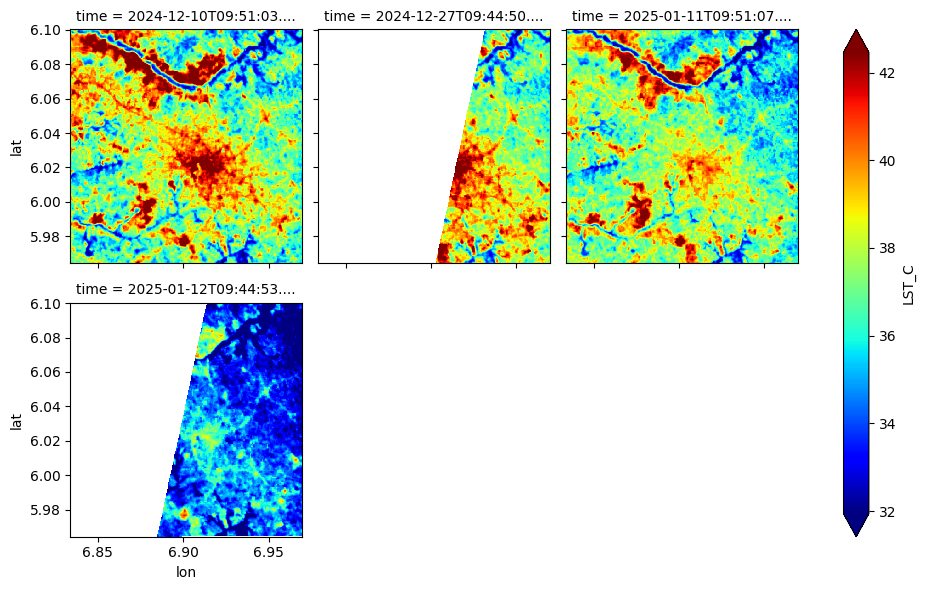

In [ ]:
ds.LST_C.plot(
    x = 'lon',
    y = 'lat',
    col = 'time',
    col_wrap = 3,
    robust = True,
    cmap = 'jet',
)

In [ ]:
lst_df = ds.LST_C.to_dataframe()
lst_df

LST_C
time                    lon      lat            
2024-11-09 09:44:49.144 6.833992 5.964309    NaN
                                 5.964578    NaN
                                 5.964847    NaN
                                 5.965116    NaN
                                 5.965385    NaN
...                                          ...
2025-03-24 09:50:39.650 6.969568 6.099078    NaN
                                 6.099347    NaN
                                 6.099616    NaN
                                 6.099885    NaN
                                 6.100154    NaN

[4344010 rows x 1 columns]

In [ ]:
lst_df.to_csv('lst_df.csv')

In [ ]:
lst_df = pd.read_csv('lst_df.csv')
lst_df.columns

Index(['time', 'lon', 'lat', 'LST_C'], dtype='object')

In [ ]:
lst_df['time'] = pd.to_datetime(lst_df['time'])
lst_df

,time,lon,lat,LST_C
0,2024-11-09 09:44:49.144,6.833992,5.964309,NaN
1,2024-11-09 09:44:49.144,6.833992,5.964578,NaN
2,2024-11-09 09:44:49.144,6.833992,5.964847,NaN
3,2024-11-09 09:44:49.144,6.833992,5.965116,NaN
4,2024-11-09 09:44:49.144,6.833992,5.965385,NaN
...,...,...,...,...
4344005,2025-03-24 09:50:39.650,6.969568,6.099078,NaN
4344006,2025-03-24 09:50:39.650,6.969568,6.099347,NaN
4344007,2025-03-24 09:50:39.650,6.969568,6.099616,NaN
4344008,2025-03-24 09:50:39.650,6.969568,6.099885,NaN


In [ ]:
df = lst_df.copy()

In [ ]:
df_lst = df[['LST_C', 'time']].copy()
df_lst['time'] = pd.to_datetime(df_lst['time'])
df_lst = df_lst.set_index('time')
df_lst = df_lst.sort_index()
df_lst = df_lst.dropna()

In [ ]:
# Assuming df_lst is the DataFrame after your initial preprocessing steps
# df_lst has 'LST_C' as a column and 'time' as the index.

# 1. Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df_lst['LST_C'].quantile(0.25)
Q3 = df_lst['LST_C'].quantile(0.75)

# 2. Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1

# 3. Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# 4. Filter the DataFrame to keep only the non-outliers
df_lst_clean = df_lst[
    (df_lst['LST_C'] >= lower_bound) & (df_lst['LST_C'] <= upper_bound)
].copy()

# df_lst_clean is your final DataFrame with outliers removed

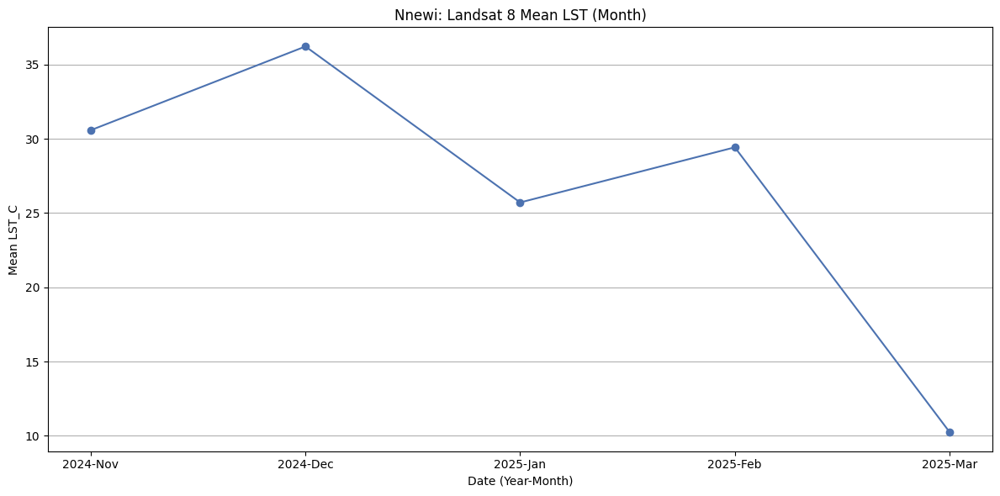

In [ ]:
# Assuming 'df_lst_clean' is your final DataFrame from the previous step (time-indexed, no outliers)
import matplotlib.dates as mdates  # <-- ADD THIS IMPORT
# 1. Group the cleaned data by month
grouped_data = df_lst_clean.groupby(df_lst_clean.index.to_period('M'))['LST_C'].mean()
# 1. Prepare the plot and the labels

# Convert the PeriodIndex to a list of explicit Year-Month strings (e.g., '2024-Nov')
# This is the string array we want on the x-axis
formatted_labels = [p.strftime('%Y-%b') for p in grouped_data.index]

# The data points (Mean LST_C)
y_values = grouped_data.values

# The tick positions (simple integers: 0, 1, 2, 3, 4, ...)
x_positions = range(len(formatted_labels))

# 2. Plot the data
plt.figure(figsize=(12, 6))

# Plot the y_values against the simple integer positions
plt.plot(x_positions, y_values, marker='o', linestyle='-')

# 3. Set the custom labels at the integer positions
# This is the key step to correctly map the formatted strings to the points
plt.xticks(
    ticks=x_positions,
    labels=formatted_labels,
    rotation=0,
    ha='center',
    # ha='right'
)

# 4. Finalize plot
plt.title(f'{current_location}: Landsat 8 Mean LST (Month)')
plt.xlabel('Date (Year-Month)')
plt.ylabel('Mean LST_C')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [ ]:
lst_ds_monthly = ds.groupby('time.month').mean('time')
lst_ds_monthly

<xarray.Dataset> Size: 51MB
Dimensions:  (month: 5, lon: 505, lat: 506)
Coordinates:
  * month    (month) int64 40B 1 2 3 11 12
  * lon      (lon) float64 4kB 6.834 6.834 6.835 6.835 ... 6.969 6.969 6.97
  * lat      (lat) float64 4kB 5.964 5.965 5.965 5.965 ... 6.099 6.1 6.1 6.1
Data variables:
    LST_C    (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    NDVI     (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    NDBI     (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    UI       (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    SAVI2    (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    EVI2     (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    NDWI     (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    MNDWI    (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    NDMI     (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
    MSAVI    (month, lon, lat) float32 5MB nan nan nan nan ... nan nan nan nan
Attributes: (12/26)
    date_range:             [1365638400000, 1654560000000]
    description:            <p>This dataset contains atmospherically correcte...
    keywords:               ['cfmask', 'cloud', 'fmask', 'global', 'l8sr', 'l...
    period:                 0
    product_tags:           ['global', 'sr', 'reflectance', 'l8sr', 'lst', 'c...
    provider:               USGS
    ...                     ...
    visualization_1_name:   Near Infrared (543)
    visualization_2_bands:  SR_B7,SR_B5,SR_B3
    visualization_2_max:    30000.0
    visualization_2_min:    0.0
    visualization_2_name:   Shortwave Infrared (753)
    crs:                    EPSG:4326

In [ ]:
lst_ds_daily = ds.groupby('time.day').mean('time')
lst_ds_daily

<xarray.Dataset> Size: 174MB
Dimensions:  (day: 17, lon: 505, lat: 506)
Coordinates:
  * day      (day) int64 136B 1 2 3 4 8 9 11 12 13 16 17 18 19 24 25 27 28
  * lon      (lon) float64 4kB 6.834 6.834 6.835 6.835 ... 6.969 6.969 6.97
  * lat      (lat) float64 4kB 5.964 5.965 5.965 5.965 ... 6.099 6.1 6.1 6.1
Data variables:
    LST_C    (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    NDVI     (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    NDBI     (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    UI       (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    SAVI2    (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    EVI2     (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    NDWI     (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    MNDWI    (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    NDMI     (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
    MSAVI    (day, lon, lat) float32 17MB nan nan nan nan ... nan nan nan nan
Attributes: (12/26)
    date_range:             [1365638400000, 1654560000000]
    description:            <p>This dataset contains atmospherically correcte...
    keywords:               ['cfmask', 'cloud', 'fmask', 'global', 'l8sr', 'l...
    period:                 0
    product_tags:           ['global', 'sr', 'reflectance', 'l8sr', 'lst', 'c...
    provider:               USGS
    ...                     ...
    visualization_1_name:   Near Infrared (543)
    visualization_2_bands:  SR_B7,SR_B5,SR_B3
    visualization_2_max:    30000.0
    visualization_2_min:    0.0
    visualization_2_name:   Shortwave Infrared (753)
    crs:                    EPSG:4326

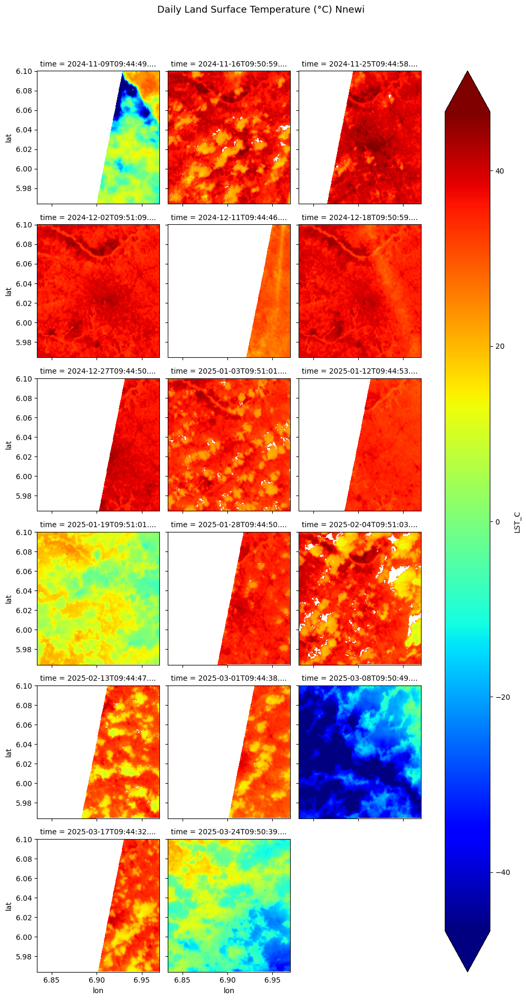

In [ ]:
ds.LST_C.plot(
    x = 'lon',
    y = 'lat',
    col = 'time',
    col_wrap = 3,
    robust = True,
    cmap = 'jet',
)
plt.suptitle(f"Daily Land Surface Temperature (°C) {current_location}", fontsize=13, y=1.05)

# plt.savefig('Onitsha December Image from Hottest Monthly LST IMAGE.png', dpi=300, bbox_inches='tight')

plt.show()

In [ ]:
# day26 = lst_ds_daily.sel(day=26)
# day26

In [ ]:
# df26 = day26.to_dataframe().dropna()
# df26

In [ ]:
# lst_ds_daily.sel(day=[10,26]).LST_C.plot(
#     x = 'lon',
#     y = 'lat',
#     col = 'day',
#     col_wrap = 2,
#     robust = True,
#     cmap = 'jet',
# )
# plt.suptitle("Daily Land Surface Temperature (°C) Nnewi, December 2024\nLST range: 28.07°C – 44.84°C", fontsize=10, y=1.09)

# # plt.savefig('Onitsha December Image from Hottest Monthly LST IMAGE.png', dpi=300, bbox_inches='tight')

# plt.show()

In [ ]:
# day19 = lst_ds_daily.sel(day=19)

# # Compute min and max (ignoring NaN)
# min_val = float(day19.LST_C.min().values)
# max_val = float(day19.LST_C.max().values)

# print(f"Day 19 LST range: {min_val:.2f}°C – {max_val:.2f}°C")


In [ ]:
# # Select days 10 and 26
# selected_days = lst_ds_daily.sel(day=[10, 26])

# # Compute min and max for each selected day
# for d in selected_days.day.values:
#     day_data = selected_days.sel(day=d)
#     min_val = float(day_data.LST_C.min().values)
#     max_val = float(day_data.LST_C.max().values)
#     print(f"Day {int(d)} → Min: {min_val:.2f}°C, Max: {max_val:.2f}°C")


In [ ]:
# ======================================================
# 2️⃣ Define ROI and Load Landsat 8 & 9 Collections
# ======================================================

landsat8 = ee.ImageCollection("LANDSAT/LC08/C02/T1_L2")
landsat9 = ee.ImageCollection("LANDSAT/LC09/C02/T1_L2")

# Merge Landsat 8 & 9 and filter
lst_col = (landsat9.merge(landsat8)
           .filterBounds(roi)
           .filterDate('2024-11-01', '2025-04-30')
           .map(lambda img: img.clip(roi).copyProperties(img, ['system:time_start']))
)

In [ ]:
# ======================================================
# 3️⃣ Cloud Mask and LST Calculation
# ======================================================
def mask_clouds(img):
    qa_pixel = img.select('QA_PIXEL')
    cloud_mask = qa_pixel.bitwiseAnd(1 << 3).eq(0) \
        .And(qa_pixel.bitwiseAnd(1 << 4).eq(0))
    return img.updateMask(cloud_mask)

def calc_lst(img):
    # Convert ST_B10 band to Celsius
    lst = img.select('ST_B10').multiply(0.00341802).add(149.0).subtract(273.15)
    return lst.rename('LST').copyProperties(img, ['system:time_start'])

lst_images = lst_col.map(mask_clouds).map(calc_lst)

In [ ]:
# ======================================================
# 4️⃣ Compute Constant Total ROI Pixel Count (FIXED)
# ======================================================
roi_area_m2 = roi.area()
roi_total_pix = roi_area_m2.divide(30**2)  # constant pixel baseline

# ======================================================
# 5️⃣ Compute Coverage and Cloud %
# ======================================================
def compute_stats_fixed(img):
    valid_pix = img.mask().reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=roi,
        scale=30,
        maxPixels=1e13
    ).values().get(0)

    coverage = ee.Number(valid_pix).divide(roi_total_pix).multiply(100)
    cloud = ee.Number(100).subtract(coverage)

    return img.set({
        'coverage_pct': coverage,
        'cloud_pct': cloud
    })

lst_stats = lst_images.map(compute_stats_fixed)

In [ ]:
# ======================================================
# 6️⃣ Extract Data to Pandas
# ======================================================
dates = lst_stats.aggregate_array('system:time_start').getInfo()
coverage = lst_stats.aggregate_array('coverage_pct').getInfo()
cloud = lst_stats.aggregate_array('cloud_pct').getInfo()

df = pd.DataFrame({
    'Date': pd.to_datetime(dates, unit='ms'),
    'Coverage (%)': coverage,
    'Cloud (%)': cloud
}).sort_values('Date')

In [ ]:
df['location'] = current_location
df

,Date,Coverage (%),Cloud (%),location
0,2024-11-01 09:44:52.194,24.601043,75.398957,Nnewi
12,2024-11-08 09:51:03.997,51.111353,48.888647,Nnewi
23,2024-11-09 09:44:49.144,0.194852,99.805148,Nnewi
33,2024-11-16 09:50:59.261,51.714927,48.285073,Nnewi
1,2024-11-17 09:44:55.735,47.950623,52.049377,Nnewi
13,2024-11-24 09:51:14.028,97.050481,2.949519,Nnewi
24,2024-11-25 09:44:58.908,60.426639,39.573361,Nnewi
34,2024-12-02 09:51:09.233,99.618868,0.381132,Nnewi
2,2024-12-03 09:45:01.089,8.319278,91.680722,Nnewi
14,2024-12-10 09:51:03.651,99.618469,0.381531,Nnewi


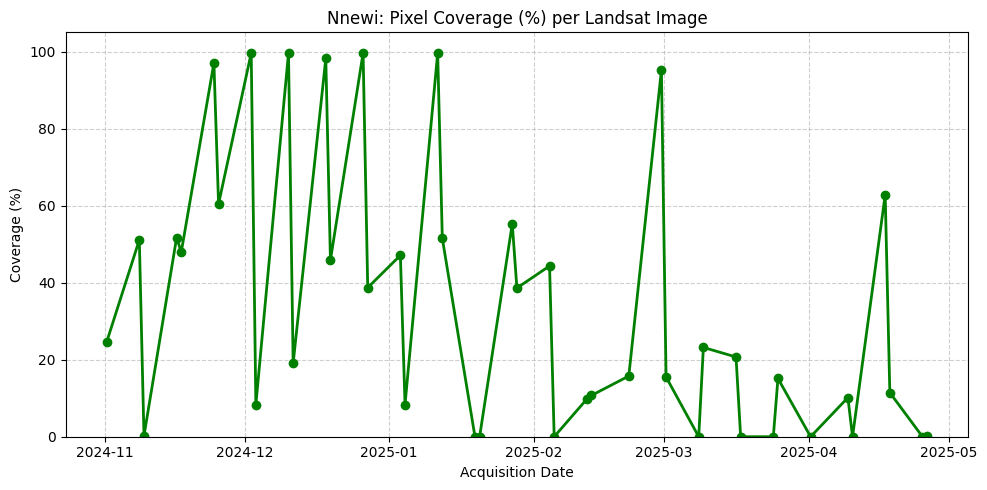

In [ ]:
# ======================================================
# 7️⃣ Plot Graphs
# ======================================================
plt.style.use('seaborn-v0_8-deep')

# --- (a) Pixel Coverage Over Time ---
plt.figure(figsize=(10,5))
plt.plot(df['Date'], df['Coverage (%)'], marker='o', color='green', linewidth=2)
plt.title(f'{current_location}: Pixel Coverage (%) per Landsat Image')
plt.xlabel('Acquisition Date')
plt.ylabel('Coverage (%)')
plt.ylim(0, 105)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

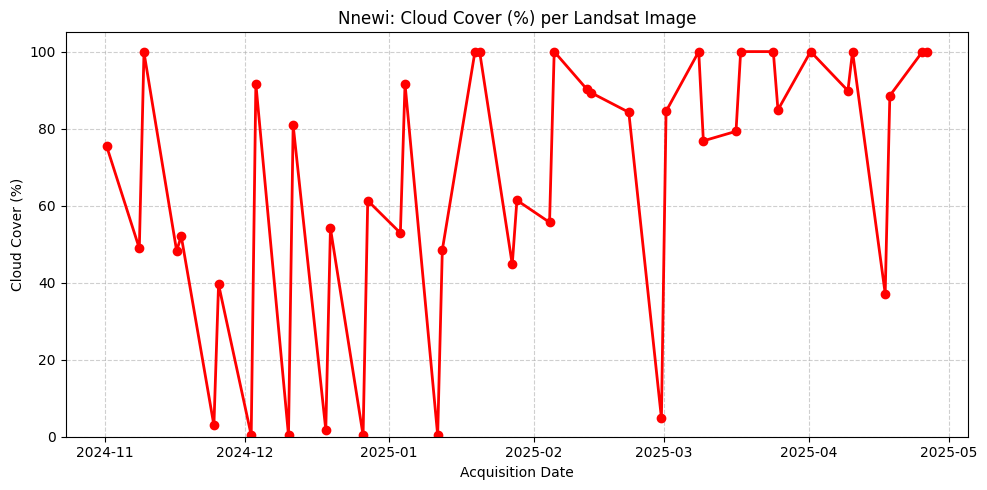

In [ ]:
# --- (b) Cloud Cover Over Time ---
plt.figure(figsize=(10,5))
plt.plot(df['Date'], df['Cloud (%)'], marker='o', color='red', linewidth=2)
plt.title(f'{current_location}: Cloud Cover (%) per Landsat Image')
plt.xlabel('Acquisition Date')
plt.ylabel('Cloud Cover (%)')
plt.ylim(0, 105)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
# ======================================================
# 8️⃣ Filter “Good” Images (High Coverage + Low Cloud)
# ======================================================
good_df = df[(df['Coverage (%)'] >= 95) & (df['Cloud (%)'] <= 10)]

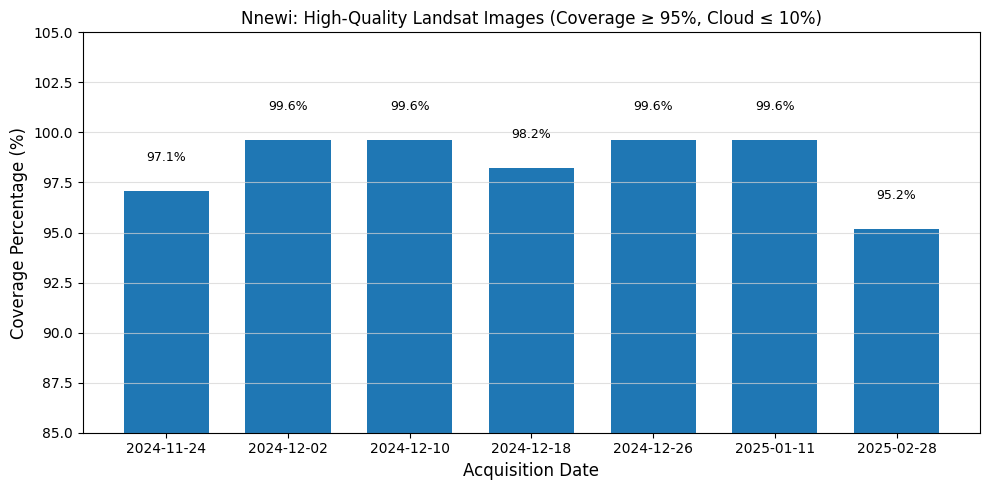

In [ ]:
# --- (c) Bar Chart for Good Images ---
plt.figure(figsize=(10, 5)) # ⬆️ Increase figure size for better readability
ax = plt.gca()

# 1. Plot the bars
dates_str = good_df['Date'].dt.strftime('%Y-%m-%d')
coverage_values = good_df['Coverage (%)']
ax.bar(dates_str, coverage_values, color='#1f77b4', width=0.7) # 🎨 Use a modern blue/teal color and set bar width

# 2. Add data labels on top of the bars
for i, v in enumerate(coverage_values):
    ax.text(i, v + 1.5, f'{v:.1f}%', color='black', ha='center', fontsize=9) # ✍️ Show exact percentage above each bar

# 3. Titles and Labels
ax.set_title(f'{current_location}: High-Quality Landsat Images (Coverage ≥ 95%, Cloud ≤ 10%)', fontsize= 12) # 📝 More descriptive title
ax.set_xlabel('Acquisition Date', fontsize=12)
ax.set_ylabel('Coverage Percentage (%)', fontsize=12)

# 4. Axes and Grid
ax.set_ylim(85, 105) # 🎯 Zoom in on Y-axis to highlight small differences in high coverage

# ✅ FIX: Use plt.xticks() for rotation and horizontal alignment (ha)
plt.xticks(ha='center')

ax.grid(axis='y', linestyle='-', alpha=0.7, color='lightgray') # ✨ Use solid lines for the grid

plt.tight_layout()
plt.show()

In [ ]:
print("✅ Images with Complete Coverage and Low Cloud:")
display(good_df)

✅ Images with Complete Coverage and Low Cloud:


,Date,Coverage (%),Cloud (%),location
13,2024-11-24 09:51:14.028,97.050481,2.949519,Nnewi
34,2024-12-02 09:51:09.233,99.618868,0.381132,Nnewi
14,2024-12-10 09:51:03.651,99.618469,0.381531,Nnewi
35,2024-12-18 09:50:59.821,98.210273,1.789727,Nnewi
15,2024-12-26 09:51:09.467,99.619266,0.380734,Nnewi
16,2025-01-11 09:51:07.086,99.619266,0.380734,Nnewi
19,2025-02-28 09:51:01.588,95.198725,4.801275,Nnewi


In [ ]:
current_location

'Nnewi'

In [ ]:
# SAVE CSV TO DRIVE
good_df['location'] = current_location
# good_df.to_csv(f'{current_location}_good_images.csv', index=False)
good_df

,Date,Coverage (%),Cloud (%),location
13,2024-11-24 09:51:14.028,97.050481,2.949519,Nnewi
34,2024-12-02 09:51:09.233,99.618868,0.381132,Nnewi
14,2024-12-10 09:51:03.651,99.618469,0.381531,Nnewi
35,2024-12-18 09:50:59.821,98.210273,1.789727,Nnewi
15,2024-12-26 09:51:09.467,99.619266,0.380734,Nnewi
16,2025-01-11 09:51:07.086,99.619266,0.380734,Nnewi
19,2025-02-28 09:51:01.588,95.198725,4.801275,Nnewi


In [ ]:
save_path = f'/content/drive/MyDrive/Anambra_lst_modelling/{current_location}_lst_data.csv'
save_path

'/content/drive/MyDrive/Anambra_lst_modelling/Nnewi_lst_data.csv'

In [ ]:
# Create folder if not exists
import os
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the dataframe
good_df.to_csv(save_path, index=False)

print(f"✅ File saved successfully to: {save_path}")

✅ File saved successfully to: /content/drive/MyDrive/Anambra_lst_modelling/Nnewi_lst_data.csv


In [ ]:
nnewi_df  = pd.read_csv('/content/drive/MyDrive/Anambra_lst_modelling/Nnewi_lst_data.csv')
nnewi_df

,Date,Coverage (%),Cloud (%),location
0,2024-11-24 09:51:14.028,97.050481,2.949519,Nnewi
1,2024-12-02 09:51:09.233,99.618868,0.381132,Nnewi
2,2024-12-10 09:51:03.651,99.618469,0.381531,Nnewi
3,2024-12-18 09:50:59.821,98.210273,1.789727,Nnewi
4,2024-12-26 09:51:09.467,99.619266,0.380734,Nnewi
5,2025-01-11 09:51:07.086,99.619266,0.380734,Nnewi
6,2025-02-28 09:51:01.588,95.198725,4.801275,Nnewi


In [ ]:
awka_df = pd.read_csv('/content/drive/MyDrive/Anambra_lst_modelling/Awka_lst_data.csv')
awka_df

,Date,Coverage (%),Cloud (%),location
0,2024-11-17 09:44:55.735,98.302919,1.697081,Awka
1,2024-12-19 09:44:57.392,99.600613,0.399387,Awka
2,2024-12-27 09:44:50.384,99.600613,0.399387,Awka
3,2025-01-12 09:44:53.545,99.558383,0.441617,Awka
4,2025-01-28 09:44:50.482,99.371531,0.628469,Awka


In [ ]:
Onitcha_df = pd.read_csv('/content/drive/MyDrive/Anambra_lst_modelling/Onitsha_lst_data.csv')
Onitcha_df

,Date,Coverage (%),Cloud (%),location
0,2024-12-02 09:51:09.233,99.632945,0.367055,Onitsha
1,2024-12-10 09:51:03.651,97.658366,2.341634,Onitsha
2,2024-12-18 09:50:59.821,98.486487,1.513513,Onitsha
3,2024-12-26 09:51:09.467,99.330762,0.669238,Onitsha
4,2025-01-11 09:51:07.086,99.543275,0.456725,Onitsha


In [ ]:
pixel_cloud_combined_data = pd.concat([awka_df, nnewi_df, Onitcha_df])
combined_df = pixel_cloud_combined_data.to_csv('/content/drive/MyDrive/Anambra_lst_modelling/pixel_cloud_combined_data.csv', index=False)

In [ ]:
combined_pixel_cloud_df = pd.read_csv('/content/drive/MyDrive/Anambra_lst_modelling/pixel_cloud_combined_data.csv')
combined_pixel_cloud_df

,Date,Coverage (%),Cloud (%),location
0,2024-11-17 09:44:55.735,98.302919,1.697081,Awka
1,2024-12-19 09:44:57.392,99.600613,0.399387,Awka
2,2024-12-27 09:44:50.384,99.600613,0.399387,Awka
3,2025-01-12 09:44:53.545,99.558383,0.441617,Awka
4,2025-01-28 09:44:50.482,99.371531,0.628469,Awka
5,2024-11-24 09:51:14.028,97.050481,2.949519,Nnewi
6,2024-12-02 09:51:09.233,99.618868,0.381132,Nnewi
7,2024-12-10 09:51:03.651,99.618469,0.381531,Nnewi
8,2024-12-18 09:50:59.821,98.210273,1.789727,Nnewi
9,2024-12-26 09:51:09.467,99.619266,0.380734,Nnewi


In [ ]:
combined_pixel_cloud_df['Date'] = pd.to_datetime(combined_pixel_cloud_df['Date'])
pixel_cloud_combined_data = combined_pixel_cloud_df.sort_values(by='Date').reset_index(drop=True)
pixel_cloud_combined_data

,Date,Coverage (%),Cloud (%),location
0,2024-11-17 09:44:55.735,98.302919,1.697081,Awka
1,2024-11-24 09:51:14.028,97.050481,2.949519,Nnewi
2,2024-12-02 09:51:09.233,99.632945,0.367055,Onitsha
3,2024-12-02 09:51:09.233,99.618868,0.381132,Nnewi
4,2024-12-10 09:51:03.651,97.658366,2.341634,Onitsha
5,2024-12-10 09:51:03.651,99.618469,0.381531,Nnewi
6,2024-12-18 09:50:59.821,98.486487,1.513513,Onitsha
7,2024-12-18 09:50:59.821,98.210273,1.789727,Nnewi
8,2024-12-19 09:44:57.392,99.600613,0.399387,Awka
9,2024-12-26 09:51:09.467,99.330762,0.669238,Onitsha


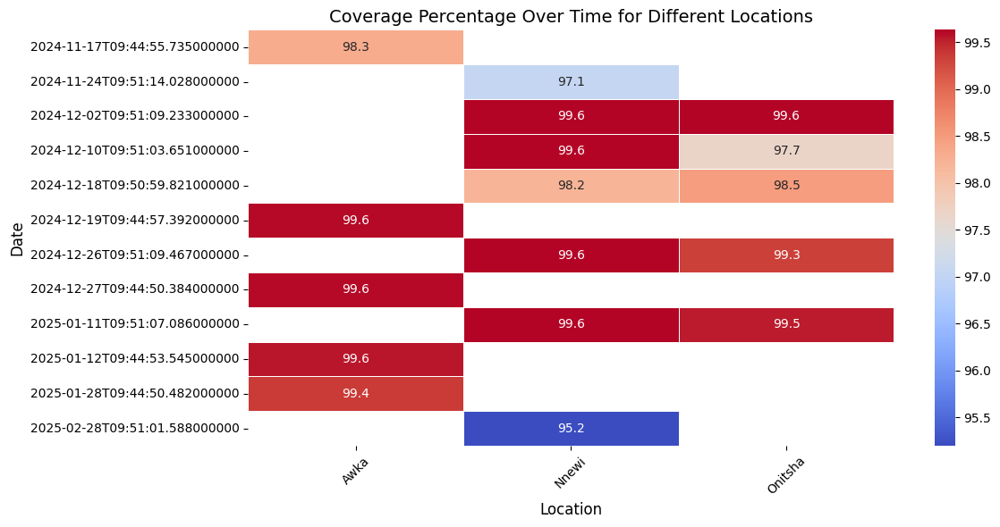

In [ ]:
import seaborn as sns
import pandas as pd

# Pivot data for heatmap
combined_pixel_cloud_df['Date'] = pd.to_datetime(combined_pixel_cloud_df['Date'])
heatmap_data = combined_pixel_cloud_df.pivot_table(index='Date', columns='location', values='Coverage (%)')

plt.figure(figsize=(12,6))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt='.1f', linewidths=.5)

plt.title('Coverage Percentage Over Time for Different Locations', fontsize=14)
plt.xlabel('Location', fontsize=12)
plt.ylabel('Date', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


grouped_bar_chart_coverage.png


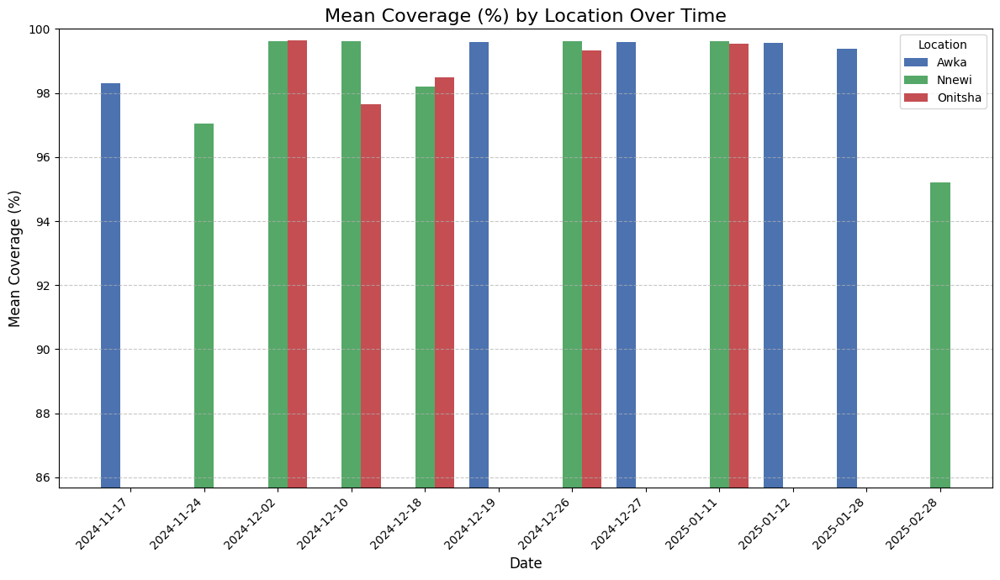

In [ ]:
import pandas as pd
import io
import matplotlib.pyplot as plt
import numpy as np

# Recreate the DataFrame from the user's provided snippet
data = """
Date,Coverage (%),Cloud (%),location
2024-11-17 09:44:55.735,98.302919,1.697081,Awka
2024-11-17 09:44:55.735,98.302919,1.697081,Awka
2024-11-24 09:51:14.028,97.050481,2.949519,Nnewi
2024-12-02 09:51:09.233,99.618868,0.381132,Nnewi
2024-12-10 09:51:03.651,99.618469,0.381531,Nnewi
2024-12-18 09:50:59.821,98.210273,1.789727,Nnewi
2024-12-19 09:44:57.392,99.600613,0.399387,Awka
2024-12-19 09:44:57.392,99.600613,0.399387,Awka
2024-12-26 09:51:09.467,99.619266,0.380734,Nnewi
2024-12-27 09:44:50.384,99.600613,0.399387,Awka
2024-12-27 09:44:50.384,99.600613,0.399387,Awka
2025-01-11 09:51:07.086,99.619266,0.380734,Nnewi
2025-01-12 09:44:53.545,99.558383,0.441617,Awka
2025-01-12 09:44:53.545,99.558383,0.441617,Awka
2025-01-28 09:44:50.482,99.371531,0.628469,Awka
2025-01-28 09:44:50.482,99.371531,0.628469,Awka
2025-02-28 09:51:01.588,95.198725,4.801275,Nnewi
"""
# pixel_cloud_combined_data = pd.read_csv(io.StringIO(data))


# Apply the user's initial cleaning steps
pixel_cloud_combined_data['Date'] = pd.to_datetime(pixel_cloud_combined_data['Date'])
pixel_cloud_combined_data = pixel_cloud_combined_data.sort_values(by='Date').reset_index(drop=True)

# Group by the date part and location, then calculate the mean
# Make sure to convert 'Date' to just the date for grouping to avoid duplicate bars for same day, different time
daily_data = pixel_cloud_combined_data.groupby([
    pixel_cloud_combined_data['Date'].dt.date,
    'location'
]).agg({
    'Coverage (%)': 'mean',
    'Cloud (%)': 'mean'
}).reset_index()

# Convert the grouped 'Date' column back to datetime for proper plotting
daily_data['Date'] = pd.to_datetime(daily_data['Date'])

# Pivot the table for plotting grouped bars
# We'll plot 'Coverage (%)' for each location on each date
pivot_df_coverage = daily_data.pivot(index='Date', columns='location', values='Coverage (%)')

# Plotting
fig, ax = plt.subplots(figsize=(12, 7))

# Define bar width and positions
num_locations = len(pivot_df_coverage.columns)
bar_width = 0.8 / num_locations
bar_positions = np.arange(len(pivot_df_coverage.index))

for i, location in enumerate(pivot_df_coverage.columns):
    ax.bar(bar_positions + i * bar_width, pivot_df_coverage[location],
           width=bar_width, label=location)

ax.set_title('Mean Coverage (%) by Location Over Time', fontsize=16)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Mean Coverage (%)', fontsize=12)
ax.set_xticks(bar_positions + bar_width * (num_locations - 1) / 2)
ax.set_xticklabels([d.strftime('%Y-%m-%d') for d in pivot_df_coverage.index], rotation=45, ha='right')
ax.legend(title='Location')
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(min(pivot_df_coverage.min()) * 0.9, 100) # Adjust Y-limit
plt.tight_layout()
plt.savefig('grouped_bar_chart_coverage.png')
print("grouped_bar_chart_coverage.png")